<h1><center>
    ECE 438: Digital Signal Processing with Applications<br/>
    Lab 3: Frequency Analysis<br/>
    <small>Date:</small><br/>
    <small>Section:</small><br>
</center></h1>

|Name |Signature |Time spent outside lab|
|:---:|:---:|:---:|
|Isaac Hau #1 [---%]| | |
|Student Name #2 [---%]| | |

||Below expectations| Lacks in some respect|Meets all expectations|
|:---:|:---:|:---:|:---:|
|**Completeness of the report**||||
|**Organization of the report**||||
|**Quality of figures**: *Correctly labeled with title, x-axis, y-axis, and name(s)*||||
|**Ability to compute Fourier series expansion and synthesize periodic signals using the expansion in Simulink (26 pts)**: *Derivation and sketch, plots of synthesized signals, questions*||||
|**Understanding of modulator and CT system analysis (26 pts)**: *Output plots, questions*||||
|**Implementation of DTFT (21 pts)**: *Python function, DTFT’s magnitude and phase plots*||||
|**DT system analysis (27 pts)**: *Exercises in 5.2, completed block diagram, table of measurements, impulse and frequency response*||||

In [1]:
import numpy as np
import matplotlib.pyplot as plt

In [2]:
# make sure the plot is displayed in this notebook
%matplotlib inline
# specify the size of the plot
plt.rcParams['figure.figsize'] = (16, 6)

# for auto-reloading extenrnal modules
%load_ext autoreload
%autoreload 2

<h3 style="color:red;"><left>Exercise 2.1</left></h3>

**1. For each of these two signals, do the following on a blank sheet of paper (or type the equations in the Markdown cell if you are familiar with LaTex):**
* **Compute the Fourier series expansion in the form**
\begin{equation}
    s(t)=a_0+\sum_{k=1}^\infty A_k\sin(2\pi kf_0t+\theta_k)
\end{equation}
where $f_0=\frac{1}{T_0}$.

    **Hint :**You may want to use one of the following references:

    Sec. 4.1 of “Digital Signal Processing”, by Proakis and Manolakis, 1996;

    Sec. 4.2 of “Signals and Systems”, by A. Oppenheim and A. Willsky, 1983;

    Sec. 3.3 of “Signals and Systems”, A. Oppenheim and A. Willsky, 1997.

    Note that in the expression above, the function in the summation is $\sin(2\pi kf_0 t + \theta k )$, rather than a complex sinusoid. The formulas in the above references must be modified to accommodate this. You can compute the cos/sin version of the Fourier series, then convert the coefficients.

write your answer here

**2. Write code to approximate the two signals using the Fourier series expansion above. Use 200 (instead of infinite number of) Sine waves. Then, plot these two signals.**

Text(0, 0.5, 's(t)')

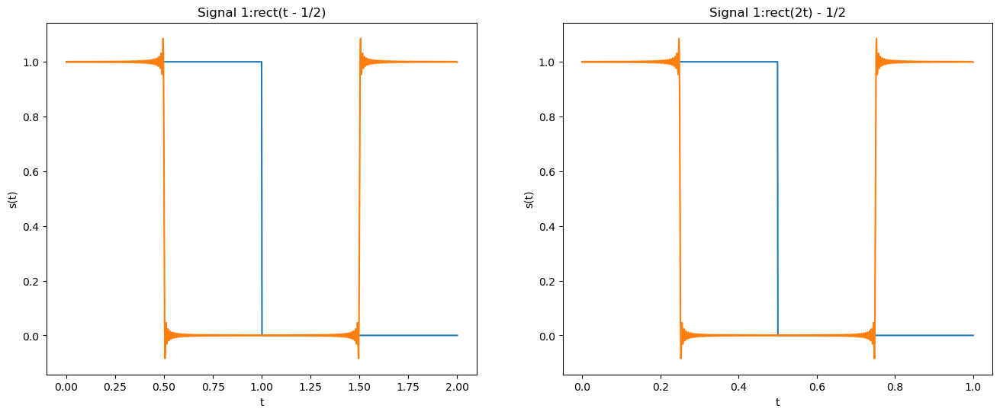

In [7]:
# write your code here
import numpy as np
import matplotlib.pyplot as plt

N = 200

T0_1 = 2
T0_2 = 1
f0_1 = 1 / T0_1
f0_2 = 1 / T0_2

t1 = np.linspace(0, 2, 1000)
t2 = np.linspace(0, 1, 1000)

s1 = np.where(np.abs(t1 - 0.5) <= 0.5, 1, 0)
s2 = np.where(np.abs(t2 * 2) <= 1, 1, 0) - 0.5

def fourier_series(t, T0, f0, N):
    a0 = 0.5 
    result = a0*np.ones_like(t)

    for k in range(1, N + 1):
        ak = 2 * np.sin(np.pi*k/2)/(np.pi * k)
        bk = 0
        result += ak * np.cos(2*np.pi * k * f0 * t) + bk * np.sin(2 * np.pi * k * f0 * t)

    return result
s1_approx = fourier_series(t1, T0_1, f0_1, N)

s2_approx = fourier_series(t2, T0_2, f0_2, N)

plt.figure(figsize = (16,6))

plt.subplot(1,2,1)
plt.plot(t1, s1, label="Original Siganl 1")
plt.plot(t1, s1_approx, label = f"Fourier Approximation (N={N})")
plt.title('Signal 1:rect(t - 1/2)')
plt.xlabel('t')
plt.ylabel('s(t)')

plt.subplot(1,2,2)
plt.plot(t2, s1, label="Original Siganl 2")
plt.plot(t2, s2_approx, label = f"Fourier Approximation (N={N})")
plt.title('Signal 1:rect(2t) - 1/2')
plt.xlabel('t')
plt.ylabel('s(t)')


<h3 style="color:red;"><left>Exercise 4.1</left></h3>

**1. Hand in plots of the Spectrum Analyzer output for each of the three synthesized waveforms.** 

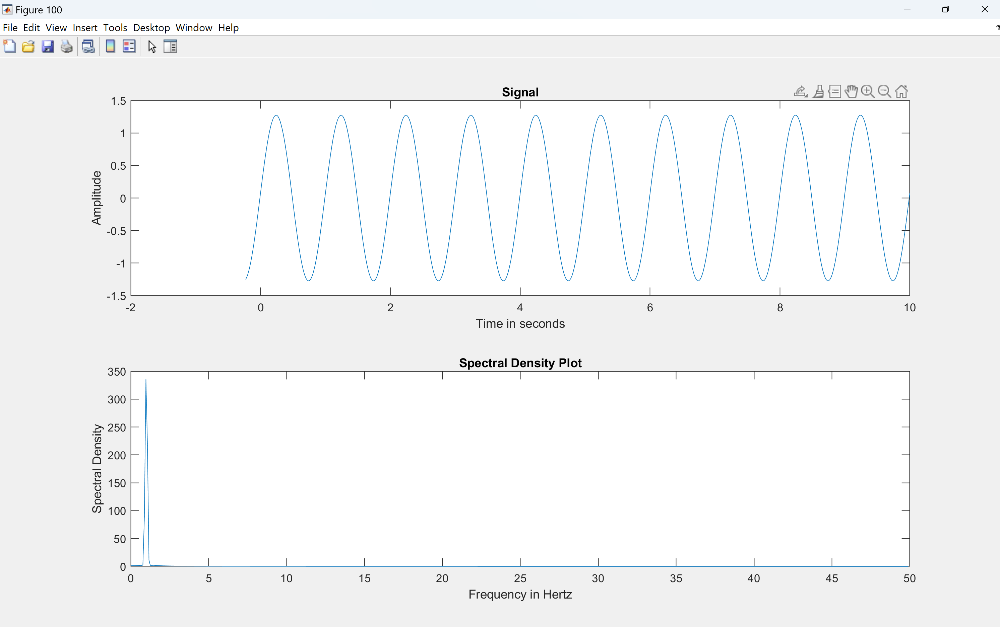
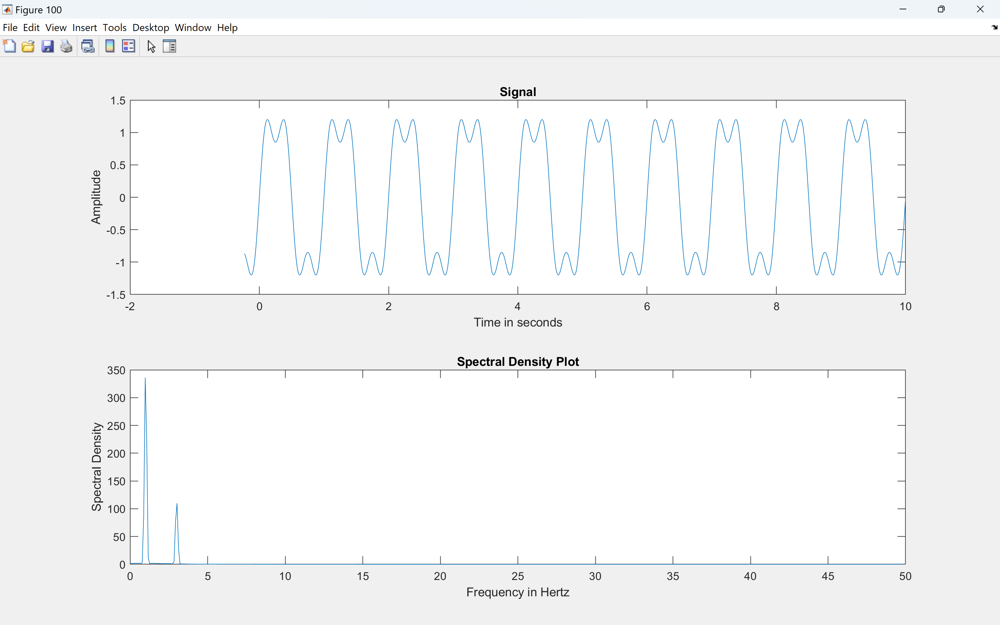
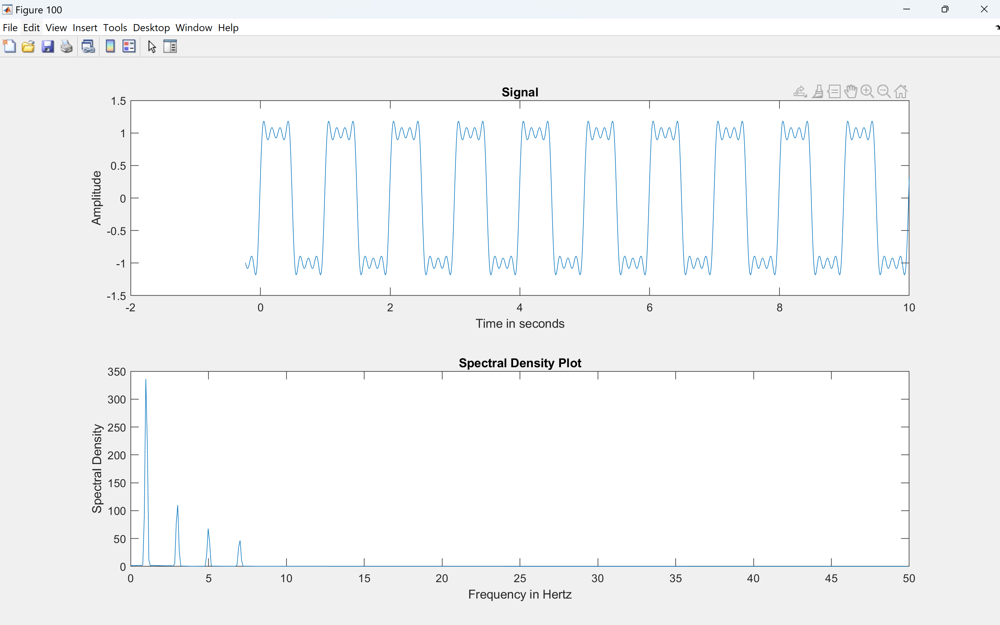

**2. For each case in Q1, comment on how the synthesized waveform differs from the desired signal,and on the structure of the spectral density.**

For plot 1, the synthesized waveform is just a sin wave so it differs greatly from the desired signal because it deos not have the sharp transitions or the flat tops and bottoms. When it comes to the Spectral density plot, the first plot only has one peak where the desired signal spectral density plot would have 7 peaks. The second plot is closer to the desired signal, but it still has some rounding in the tops and bottoms which is not desried. When it comes to the Spectral density plot, the second plot only has two peaks where the desired signal spectral density plot would have 7 peaks.  The third plot is the closest to the desired signal, but there remains some ripples near the transitions which is not desired. When it comes to the Spectral density plot, the third plot only has four peaks where the desired signal spectral density plot would have 7 peaks. 

<h3 style="color:red;"><left>Exercise 4.2</left></h3>

**1. Hand in plots of the output of the *Spectrum Analyzer* for each signal.**

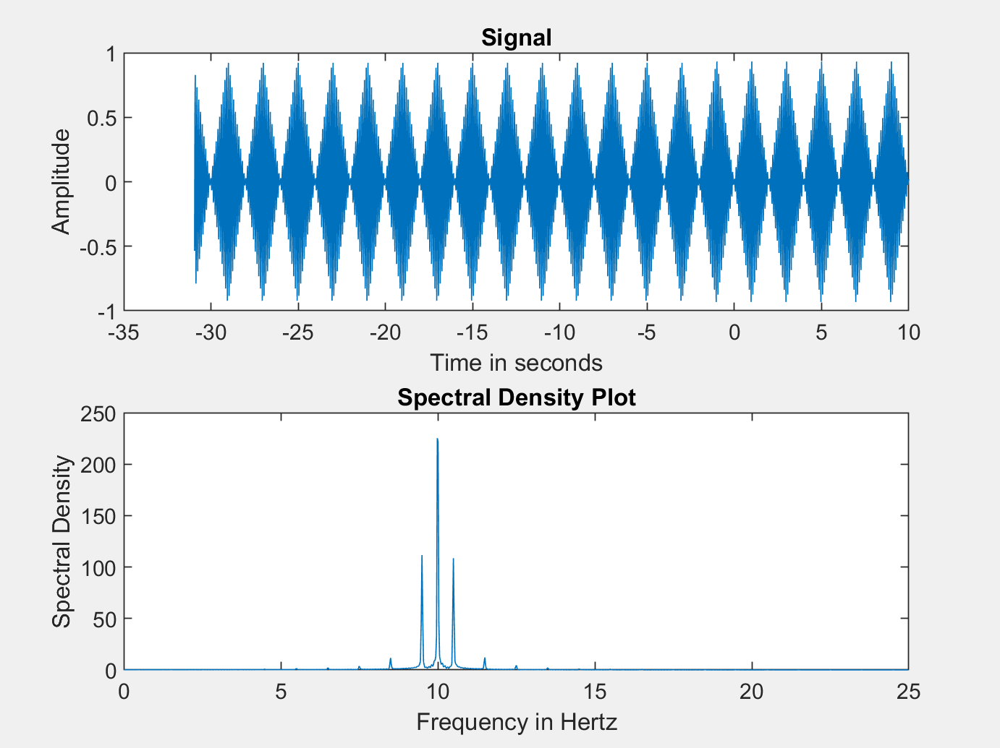
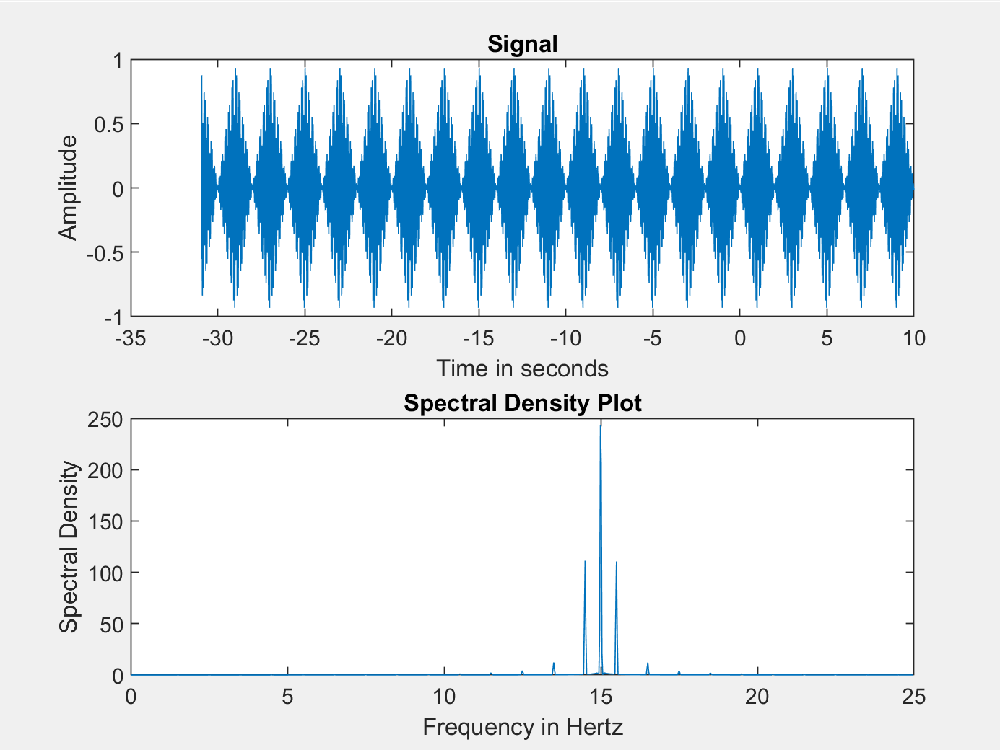
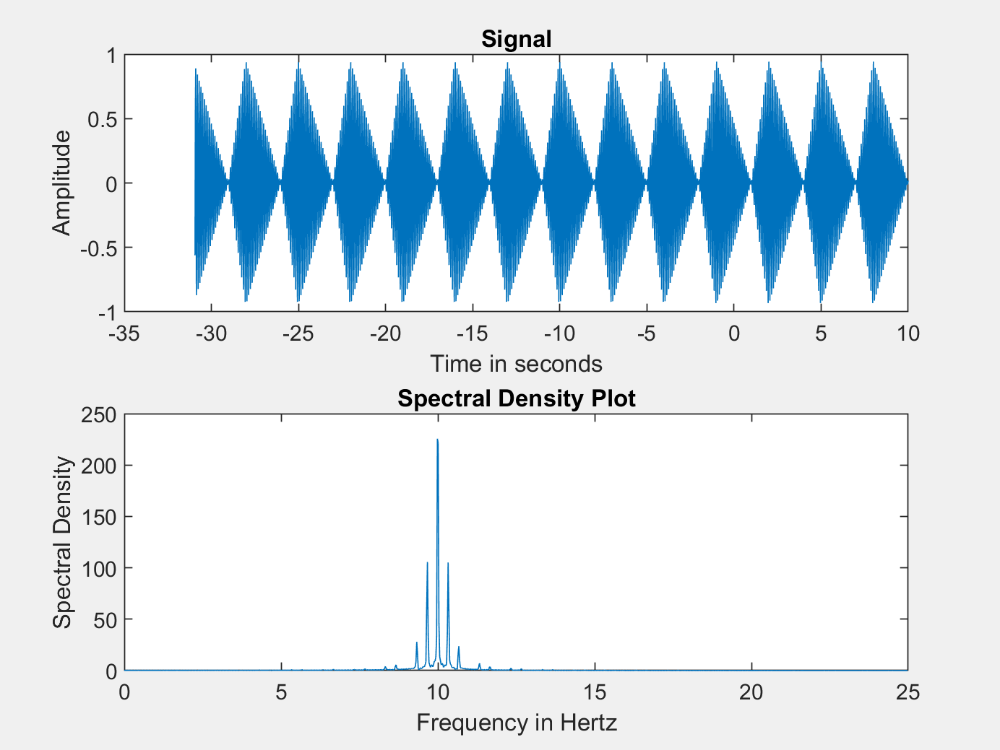
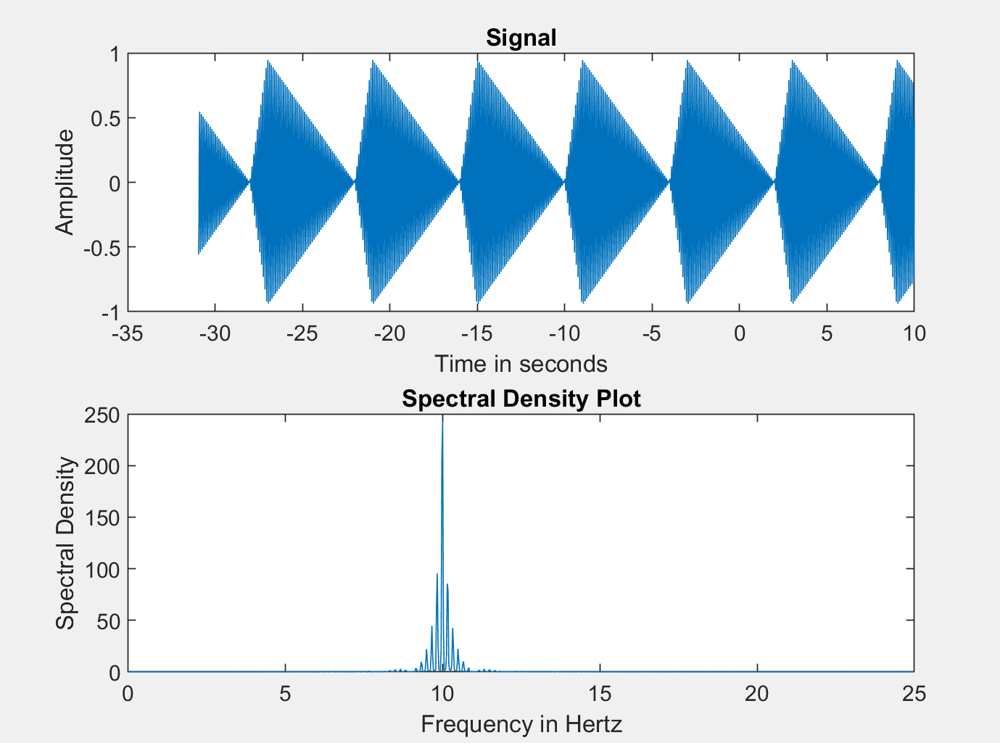

**2. What effect does changing the modulating frequency have on the spectral density?**

One effect that changing the modulating frequency had on the spectral desnisty plot is that it shifted the center of frequency of the spectral components.

**3. Why does the spectrum have a comb structure and what is the spectral distance between impulses? Why?**

The spectrum has a comb structure because the sin wave modulates the triangular pulse, which is a periodic wavefore. The spectral distance between impulses is equal to the frequency.

**4. What would happen to the spectral density if the period of the triangle pulse were to
increase toward infinity? (in the limit)**  

If the period of the triangle pulse were to increase toward infinity, the spectral density would transition from a set of discrete peaks to a continuous spectrum

<h3 style="color:red;"><left>Exercise 4.3</left></h3>

**1. Hand in the printout of the output of the Network Analyzer (magnitude and phase of the
frequency response, and the impulse response).**

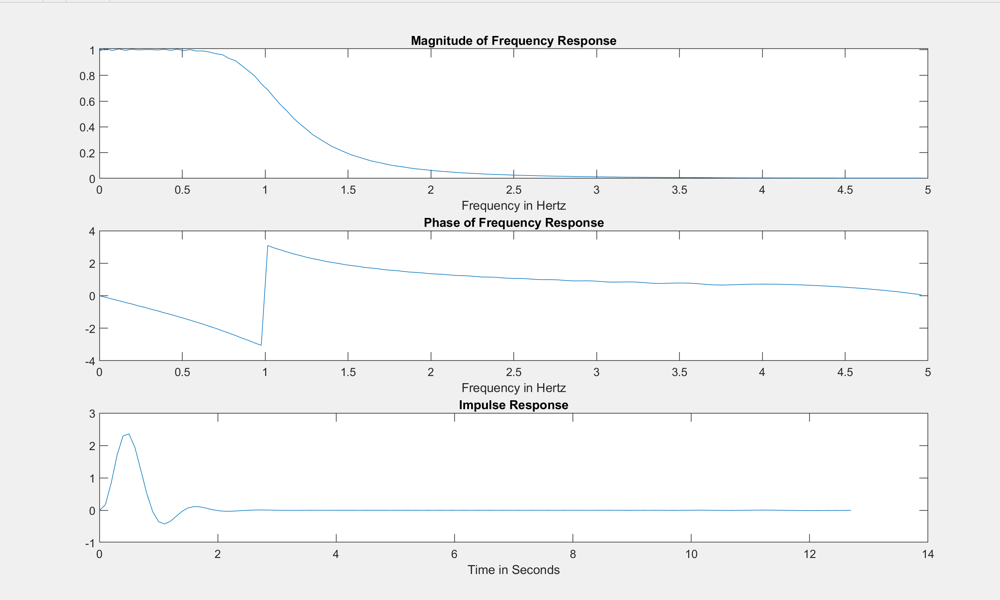

**2. Hand in the plot of the impulse response obtained using a unit step.**

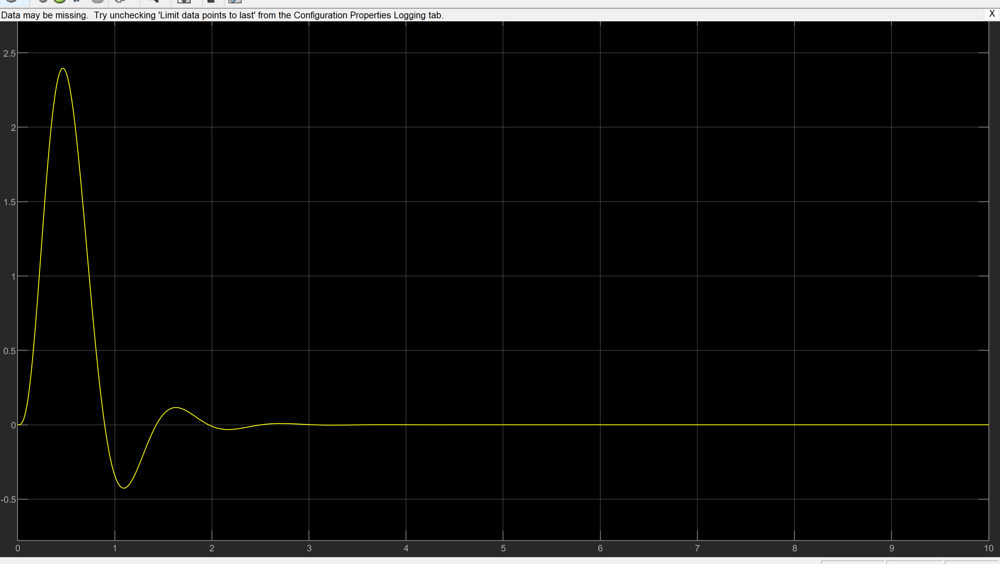

**3. What are the advantages and disadvantages of each method?**

The advantage of the Network Analzser method is that it provides detailed freuqncy domain information. Its disadvantage is it requires a more complex setup. The advantage of the Unit Step Method is it is very simple to setup. Its disadvantage is it lacks detailed frequency information such as magnitude.

<h3 style="color:red;"><left>Exercise 5.1</left></h3>

**1. Complete the follwing function that computes the DTFT of a discrete-time signal.** 
```python
def DTFT(x,n0,w):
    """
    This function computes the DTFT of a discrete-time signal.
    
    Parameters
    ---
    x: the discrete-time signal
    n0: time index corresponding to the 1st element of the x vector
    w: frequencies
    
    Returns
    ---
    X: the computed DTFT
    """
    pass
```
**Note that if ```x``` is a vector of length $N$, then its DTFT is computed by**

\begin{equation}
    X(\omega)=\sum_{n=0}^{N-1}x[n]e^{-jw(n+n0)}
\end{equation}

**where $w$ is a vector that contains the frequencies from $-\pi$ to $\pi$.**

**Hint:** In Python, ```1j``` is defined as $\sqrt{-1}$. Use `np.exp(x)` to calculate $e^x$.

In [9]:
# write your code here
def DTFT(x,n0,w):
    """
    This function computes the DTFT of a discrete-time signal.
    
    Parameters
    ---
    x: the discrete-time signal
    n0: time index corresponding to the 1st element of the x vector
    w: frequencies
    
    Returns
    ---
    X: the computed DTFT
    """
    N = len(x)
    X = np.zeros(len(w), dtype=complex)

    for i,omege in enumerate(w):
        for n in range(N):
            X[i] += x[n] * np.exp(-1j * omege * (n + n0))
    
    return X

**2. For the following signals** 

* $x[n]=\delta[n]$
* $x[n]=\delta[n-5]$
* $x[n]=(0.5)^nu[n]$

**use your DTFT function to compute $X(\omega)$, and plots its magnitude and phase.**

**Hint**: Use `np.power(a,b)` to calculate $a^b$. Use ```np.abs()``` and ```np.angle()``` to compute the magnitude and phase.

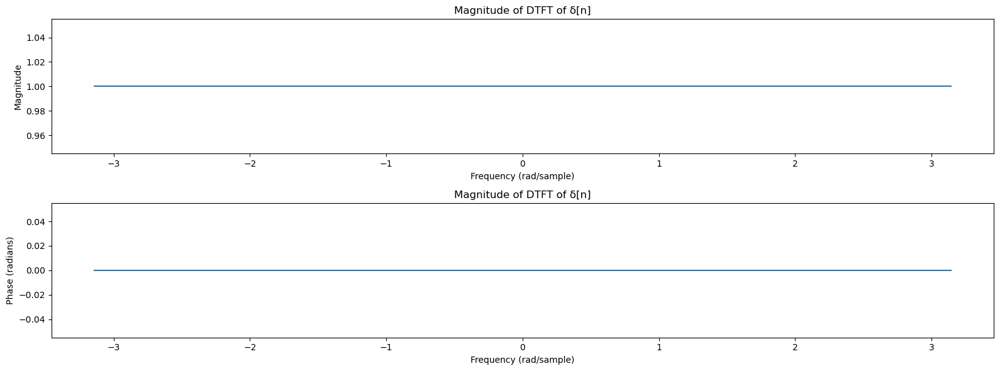

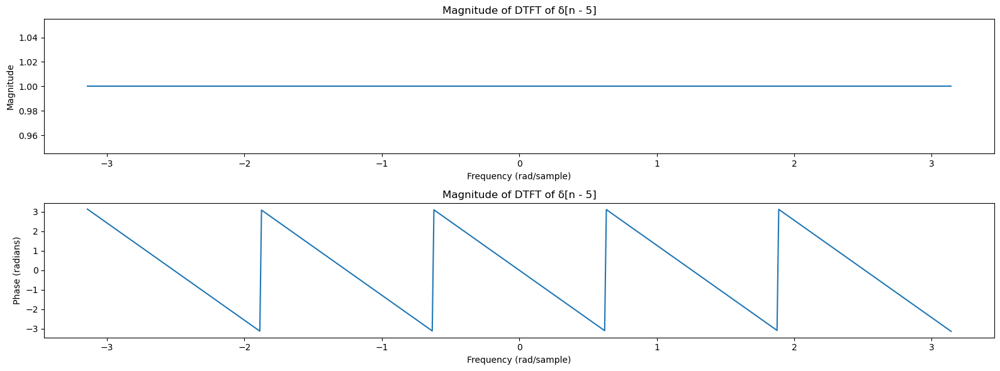

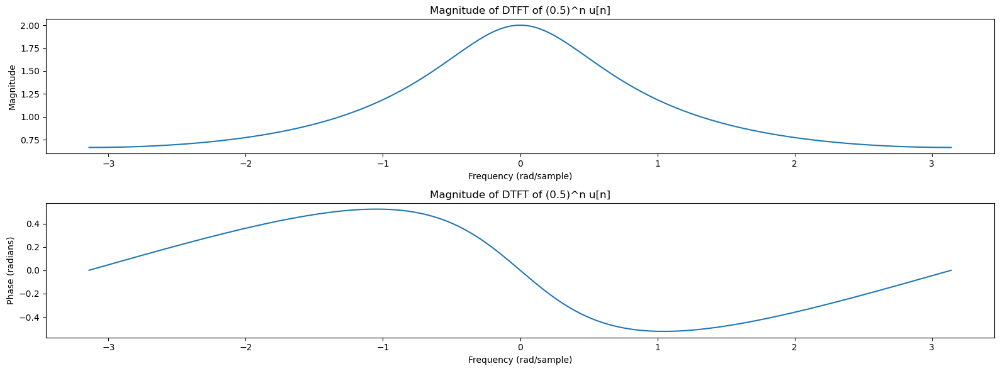

In [15]:
# write your code here
import numpy as np
import matplotlib.pyplot as plt

w = np.linspace(-np.pi, np.pi, 512)

x1 = np.array([1])
n0_1 = 0

X1 = DTFT(x1, n0_1, w)

x2 = np.concatenate((np.zeros(5), [1]))
n0_2 = 0

X2 = DTFT(x2, n0_2, w)

n = np.arange(0, 50)
x3 = np.power(0.5, n)
n0_3 = 0

X3 = DTFT(x3, n0_3, w)

def plot_dtft(X, w, title):
    magnitude = np.abs(X)
    phase = np.angle(X)

    plt.figure(figsize =(16, 6))

    plt.subplot(2,1,1)
    plt.plot(w, magnitude)
    plt.title(f'Magnitude of {title}')
    plt.xlabel('Frequency (rad/sample)')
    plt.ylabel('Magnitude')

    plt.subplot(2,1,2)
    plt.plot(w, phase)
    plt.title(f'Magnitude of {title}')
    plt.xlabel('Frequency (rad/sample)')
    plt.ylabel('Phase (radians)')

    plt.tight_layout()

plot_dtft(X1, w, 'DTFT of δ[n]')
plot_dtft(X2, w, 'DTFT of δ[n - 5]')
plot_dtft(X3, w, 'DTFT of (0.5)^n u[n]')



<h3 style="color:red;"><left>Exercise 5.2: Magnitude and Phase of the Frequency Response of a Discrete-Time Systems</left></h3>

Consider the discrete-time system described by the following difference equation:

\begin{equation}y[n]=0.9y[n-1]+0.3x[n]+0.24x[n-1]\end{equation}

Assume that the system is **causal**.

**1. Draw a system diagram.**

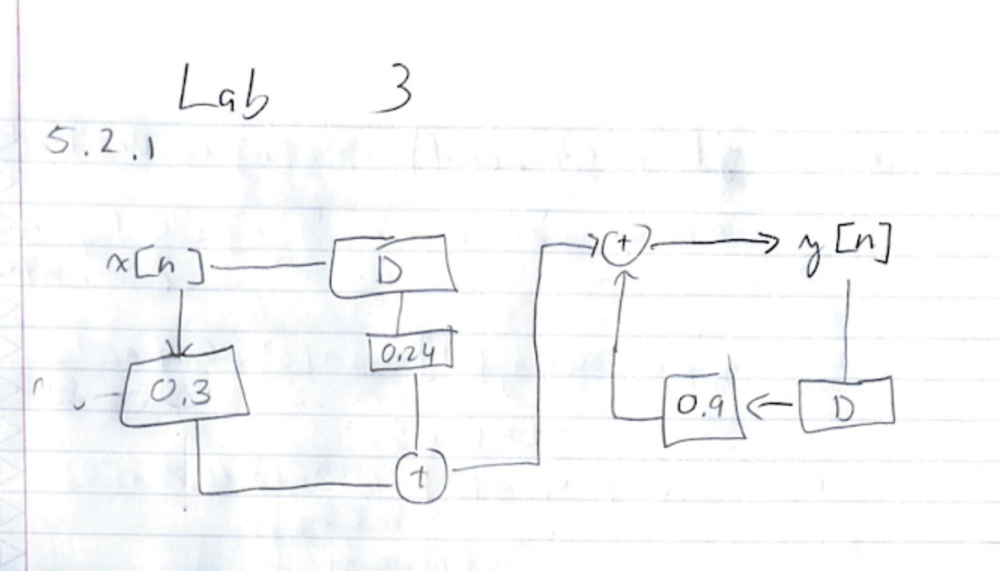

**2. Obtain the impulse response of the system by replacing $x[n]$ with $\delta[n]$ in the above equation. (Use causality to set up the initial conditions.)**

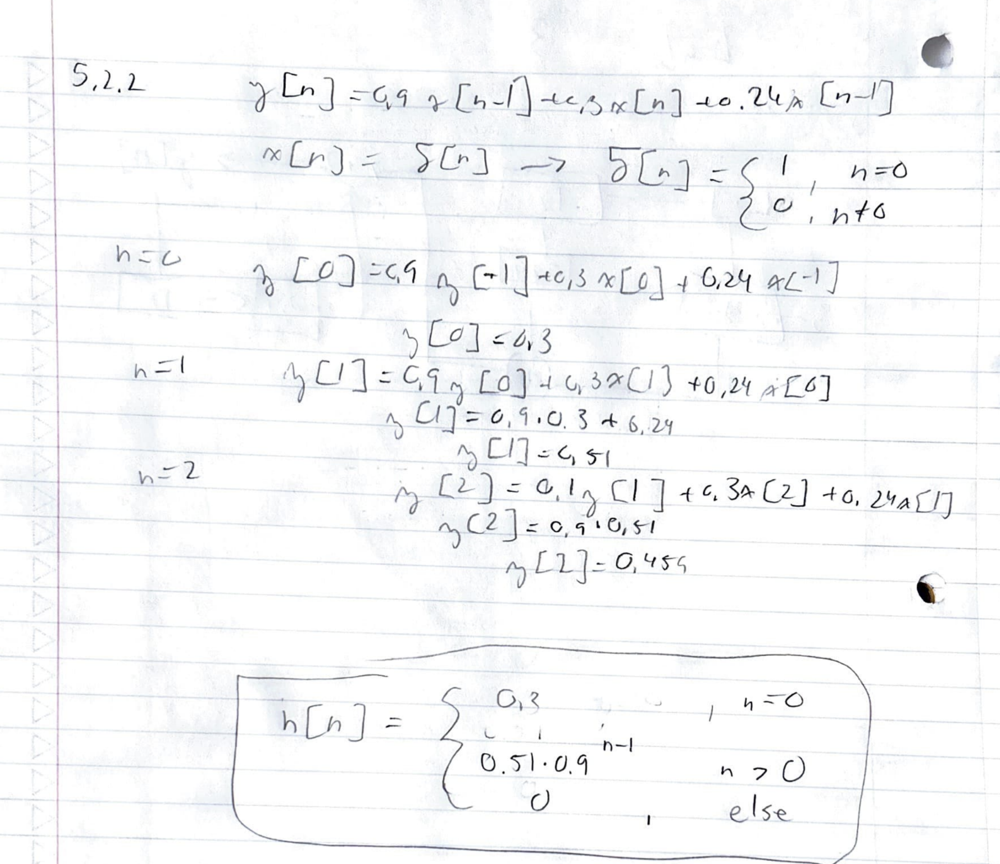

**3. Use your answer in Q2 to obtain the frequency response of the system.**

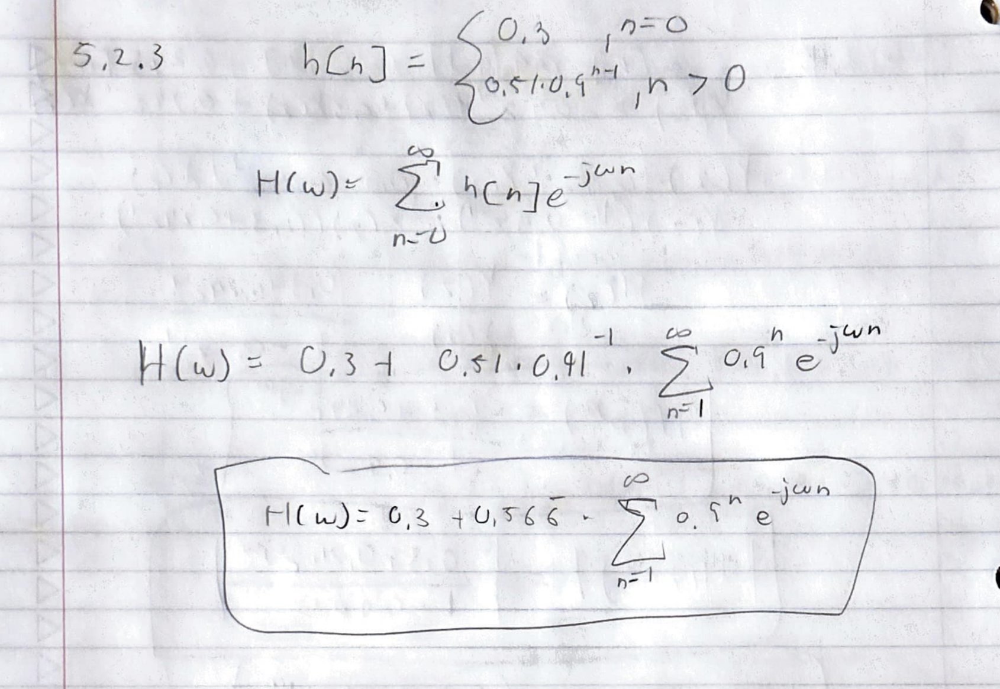

**4. Find the frequency response of the system using another method. Specifically, take the DTFT of the left-hand-side and right-hand-side of the difference equation, and then use linearity and the time-shifting property of the DTFT along with the fact that $H(\omega)=\frac{Y(\omega)}{X(\omega)}$**

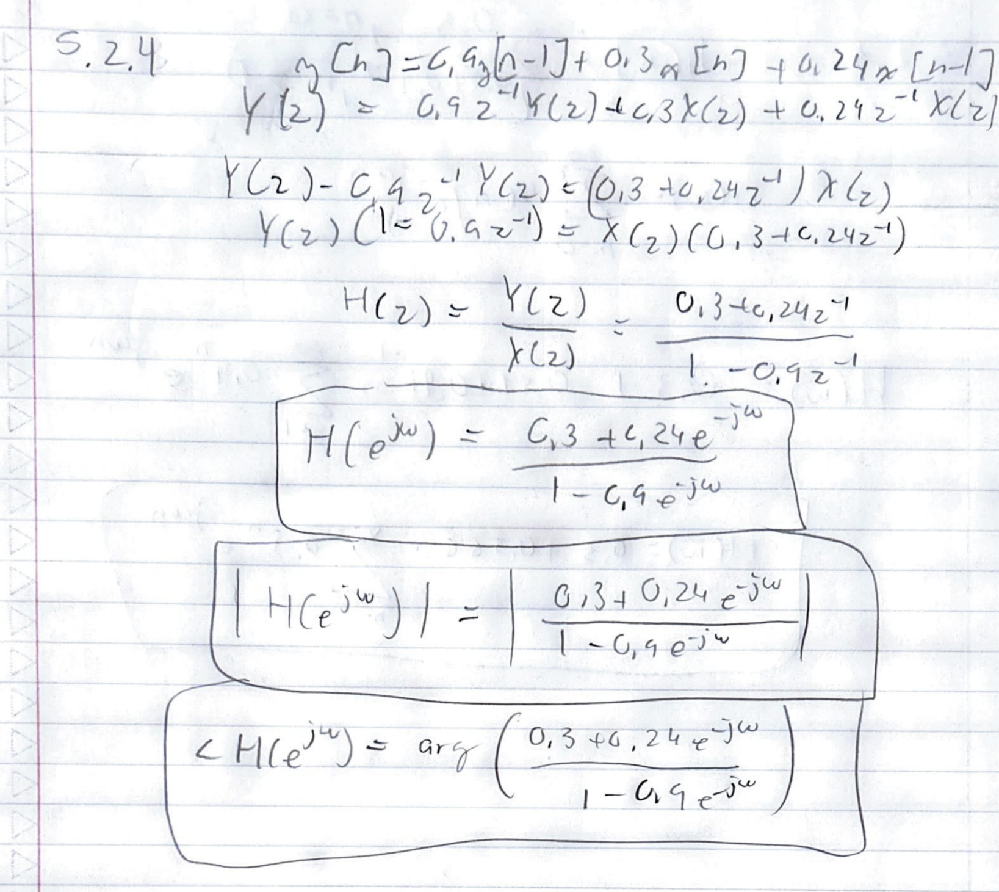

**5. Write Python code to compute and plot the magnitude and phase responses, $|H(\omega)|$ and $\angle H(\omega)$, for $-\pi<\omega<\pi$.**

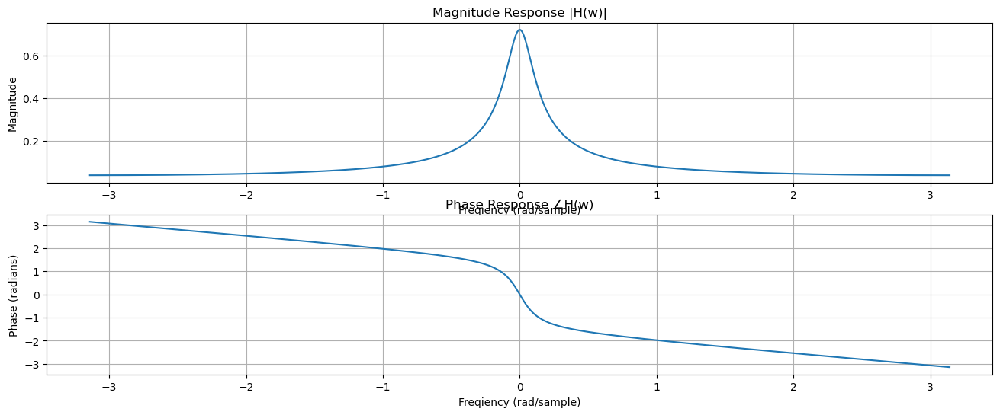

In [21]:
# write your code here
import numpy as np
import matplotlib.pyplot as plt

w = np.linspace(-np.pi, np.pi, 512)

def H(w):
    return(0.3 * 0.24*np.exp(-1j*w))/(1 - 0.9*np.exp(-1j * w))

H_w = H(w)

magnitude = np.abs(H_w)
phase = np.angle(H_w)

plt.figure(figsize=(16,6))
plt.subplot(2,1,1)
plt.plot(w, magnitude)
plt.title('Magnitude Response |H(w)|')
plt.xlabel('Freqiency (rad/sample)')
plt.ylabel('Magnitude')
plt.grid(True)

plt.subplot(2,1,2)
plt.plot(w, phase)
plt.title('Phase Response ∠H(w)')
plt.xlabel('Freqiency (rad/sample)')
plt.ylabel('Phase (radians)')
plt.grid(True)

<h3 style="color:red;"><left>Exercise 5.3</left></h3>

**1. Insert the printout of your completed block diagram.**

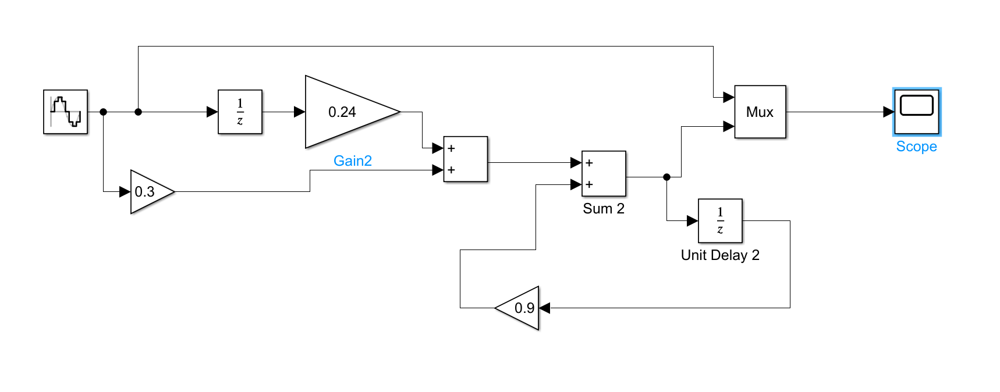

**2. Enter both the amplitude measurements you made and their theoretical values.**

| $\omega$ | Measurements | Theoretical Values |
|:--------:|:------------:|:------------------:|
| $\pi/16$ |      2.5     |           1.65     |
|  $\pi/8$ |      1.4     |           1.54     |
|  $\pi/4$ |      0.7     |           1.17     |

**3. Plot the impulse response, and the magnitude and phase of the frequency response by using your DTFT function.**

Text(0, 0.5, 'Phase H(w)')

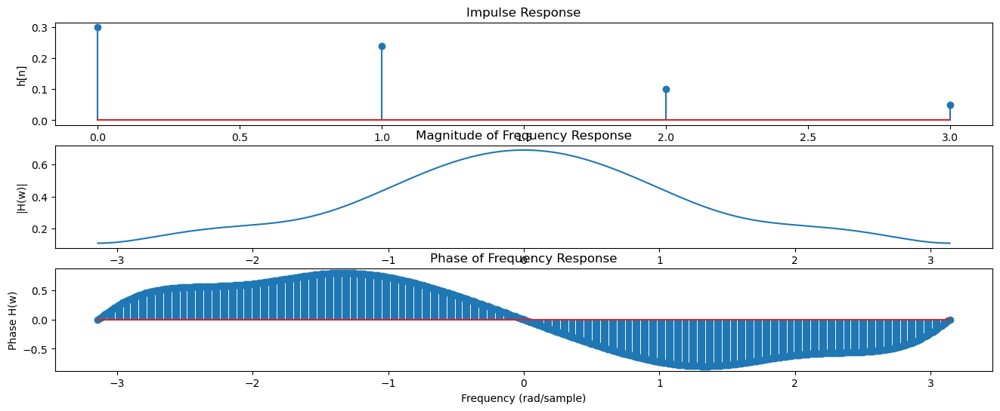

In [36]:
# write your code here
import numpy as np
import matplotlib.pyplot as plt

impulse_response = np.array([0.3, 0.24, 0.1, 0.05])
n0 = 0

w = np.linspace(-np.pi, np.pi, 512)

X_w = DTFT(impulse_response, n0, w)

magnitude = np.abs(X_w)
phase = np.angle(X_w)

plt.figure(figsize=(16,6))

plt.subplot(3,1,1)
plt.stem(impulse_response)
plt.title('Impulse Response')
plt.xlabel('n')
plt.ylabel('h[n]')

plt.subplot(3,1,2)
plt.plot(w, magnitude)
plt.title('Magnitude of Frequency Response')
plt.xlabel('Frequency (rad/sample')
plt.ylabel('|H(w)|')

plt.subplot(3,1,3)
plt.stem(w, phase)
plt.title('Phase of Frequency Response')
plt.xlabel('Frequency (rad/sample)')
plt.ylabel('Phase H(w)')

